## YOLOv3 の学習・推論用のサンプルコード

### 環境構築

In [1]:
!git clone https://github.com/ultralytics/yolov3
%cd yolov3
%pip install -qr requirements.txt

Cloning into 'yolov3'...
remote: Enumerating objects: 9946, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 9946 (delta 15), reused 28 (delta 5), pack-reused 9858
Receiving objects: 100% (9946/9946), 9.37 MiB | 16.60 MiB/s, done.
Resolving deltas: 100% (6680/6680), done.
/content/yolov3
     |████████████████████████████████| 596 kB 5.6 MB/s 


In [2]:
# import requirements
import torch
from IPython.display import Image  # for displaying images

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).

In [3]:
## BCCD Dataset
!curl -L "https://public.roboflow.com/ds/Y28hBwsxCK?key=2iPpGufxXX" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1393      0 --:--:-- --:--:-- --:--:--  1391
100 7835k  100 7835k    0     0  9428k      0 --:--:-- --:--:-- --:--:-- 9428k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/BloodImage_00038_jpg.rf.63d04b5c9db95f32fa7669f72e4903ca.jpg  
 extracting: test/images/BloodImage_00044_jpg.rf.589ee3d351cb6d9a3f7b7a942da5370a.jpg  
 extracting: test/images/BloodImage_00062_jpg.rf.1cecc20a21ac39cb54cf532081a1e893.jpg  
 extracting: test/images/BloodImage_00090_jpg.rf.5267690cb6a13608d39b0424bef3c9b4.jpg  
 extracting: test/images/BloodImage_00099_jpg.rf.744666666386a07e242e214e041945ba.jpg  
 extracting: test/images/BloodImage_00112_jpg.rf.e4b507506c4a7

In [4]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['Platelets', 'RBC', 'WBC']

### モデルの構成とアーキテクチャの定義

In [5]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
# customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic


@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, "w") as f:
        f.write(cell.format(**globals()))

In [7]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate /content/yolov3/data.yaml

train: ./train/images
val: ./test/images

nc: 3
names: ['Platelets', 'RBC', 'WBC']

In [8]:
# Let's check the data.yaml file for confirmation
%cat data.yaml


train: ./train/images
val: ./test/images

nc: 3
names: ['Platelets', 'RBC', 'WBC']

In [9]:
with open(r"data.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list["names"]

In [10]:
print(
    "Number of Classes are {}, whose labels are {} for this Object Detection project".format(
        num_classes, label_names
    )
)

Number of Classes are 3, whose labels are ['Platelets', 'RBC', 'WBC'] for this Object Detection project


In [11]:
# this is the model configuration we will use for our tutorial
# yolov3.yaml contains the configuration of neural network required for training.
%cat /content/yolov3/models/yolov3.yaml

# YOLOv3 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# darknet53 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [32, 3, 1]],  # 0
   [-1, 1, Conv, [64, 3, 2]],  # 1-P1/2
   [-1, 1, Bottleneck, [64]],
   [-1, 1, Conv, [128, 3, 2]],  # 3-P2/4
   [-1, 2, Bottleneck, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 5-P3/8
   [-1, 8, Bottleneck, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 7-P4/16
   [-1, 8, Bottleneck, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P5/32
   [-1, 4, Bottleneck, [1024]],  # 10
  ]

# YOLOv3 head
head:
  [[-1, 1, Bottleneck, [1024, False]],
   [-1, 1, Conv, [512, [1, 1]]],
   [-1, 1, Conv, [1024, 3, 1]],
   [-1, 1, Conv, [512, 1, 1]],
   [-1, 1, Conv, [1024, 3, 1]],  # 15 (P5/32-large)

   [-2, 1, Conv, [256, 1,

In [12]:
# Below we are changing the configuration so that it becomes compatible to number of classes required in this project
%%writetemplate /content/yolov3/models/custom_yolov3.yaml

# parameters
nc: {num_classes}  # number of classes  # CHANGED HERE
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv3 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv3 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [13]:
import os

os.chdir("/content/yolov3")

### 学習する

In [14]:
%%time
%cd /content/yolov3/
!python train.py --img 416 --batch 16 --epochs 100 --data './data.yaml' --cfg ./models/custom_yolov3.yaml --weights ''

/content/yolov3
train: weights=, cfg=./models/custom_yolov3.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov3 ✅
YOLOv3 🚀 v9.6.0-3-gb870de5 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0

### Tensorboard で確認

In [15]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### 可視化

GROUND TRUTH TRAINING DATA:


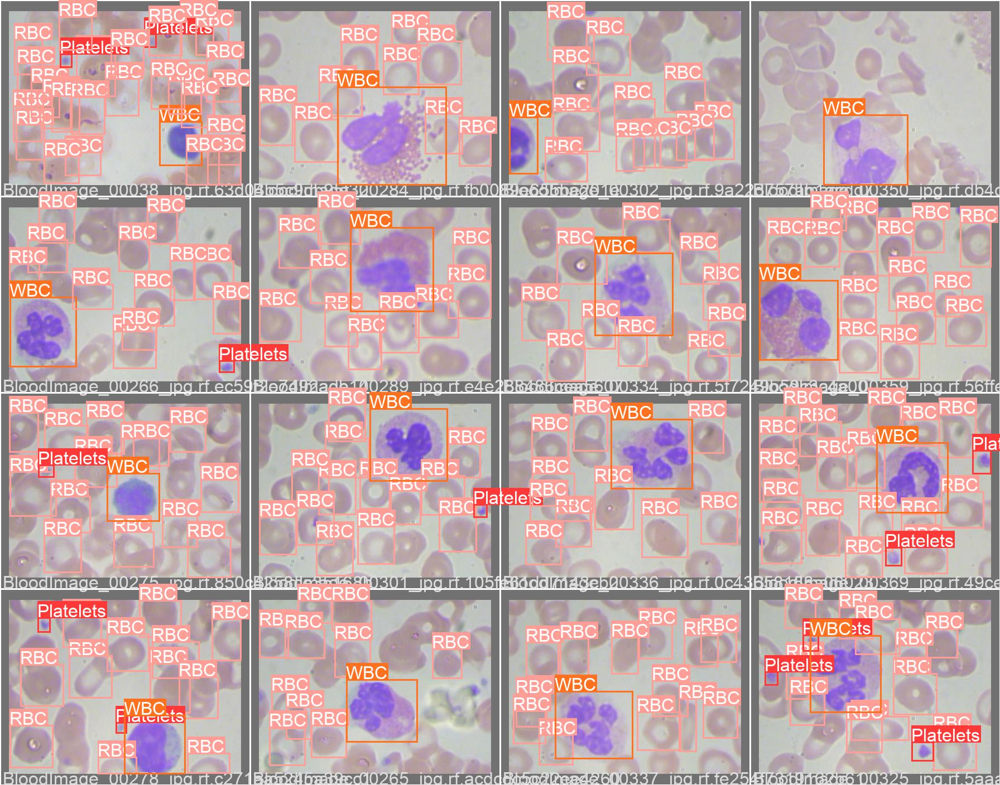

In [16]:
print("GROUND TRUTH TRAINING DATA:")
Image(
    filename="/content/yolov3/runs/train/exp/val_batch0_labels.jpg", width=900
)

GROUND TRUTH AUGMENTED TRAINING DATA:


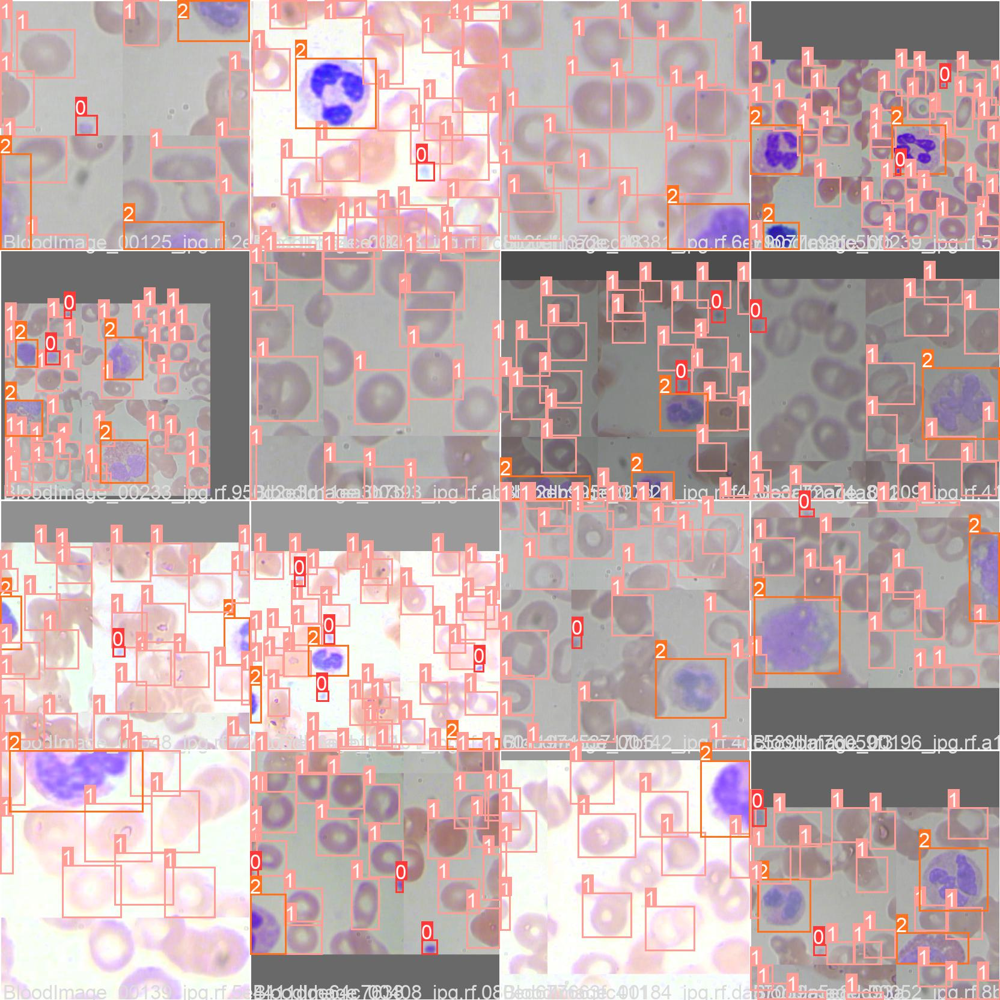

In [17]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename="/content/yolov3/runs/train/exp/train_batch0.jpg", width=900)

### 学習したモデルで推論

In [18]:
%cd /content/yolov3/
!python detect.py --weights /content/yolov3/runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source ./test/images

/content/yolov3
detect: weights=['/content/yolov3/runs/train/exp/weights/best.pt'], source=./test/images, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv3 🚀 v9.6.0-3-gb870de5 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPs
image 1/36 /content/yolov3/test/images/BloodImage_00038_jpg.rf.63d04b5c9db95f32fa7669f72e4903ca.jpg: 320x416 1 Platelets, 19 RBCs, 1 WBC, Done. (0.030s)
image 2/36 /content/yolov3/test/images/BloodImage_00044_jpg.rf.589ee3d351cb6d9a3f7b7a942da5370a.jpg: 320x416 2 Plateletss, 12 RBCs, 2 WBCs, Done. (0.025s)
image 3/36 /content/yolov3/test/images/BloodImage_00062_jpg.rf.1

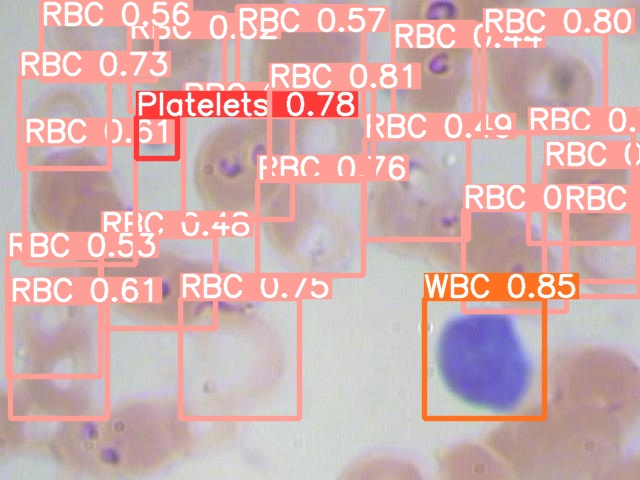

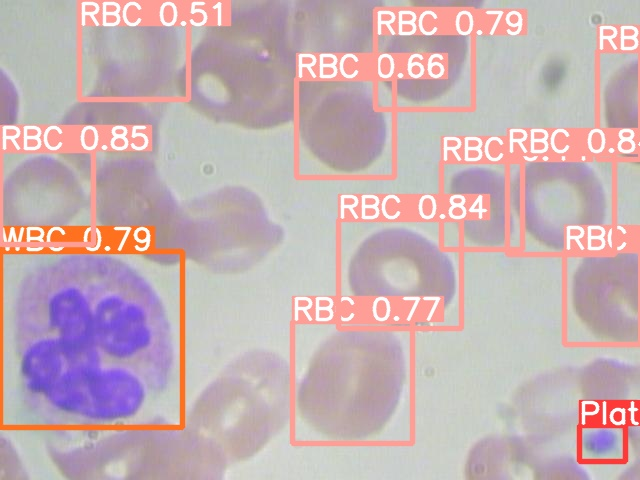

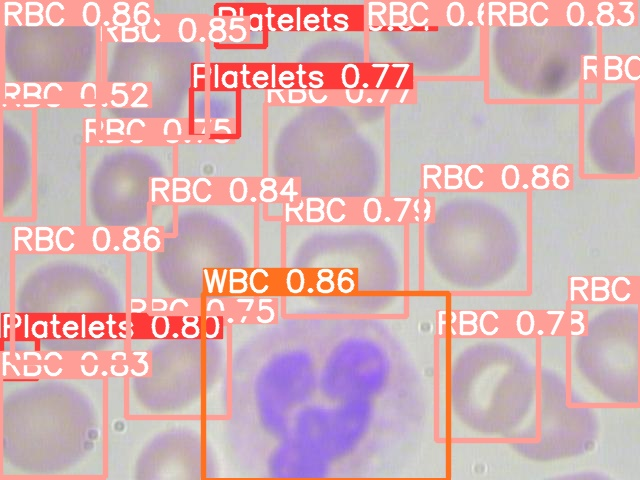

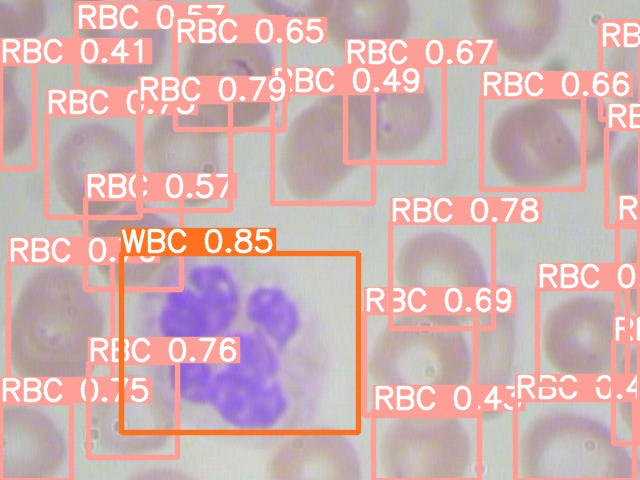

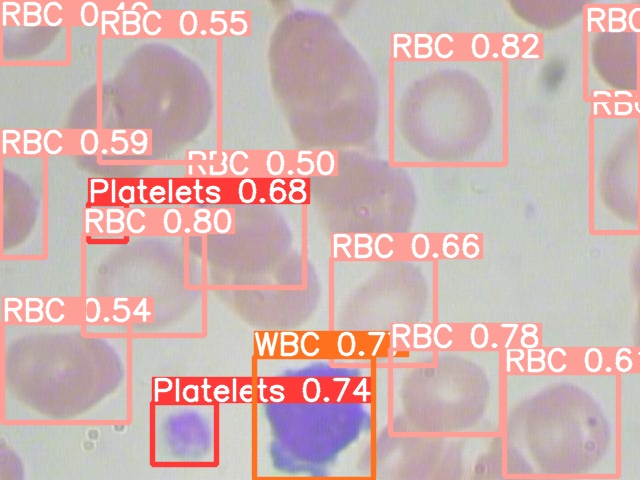

...

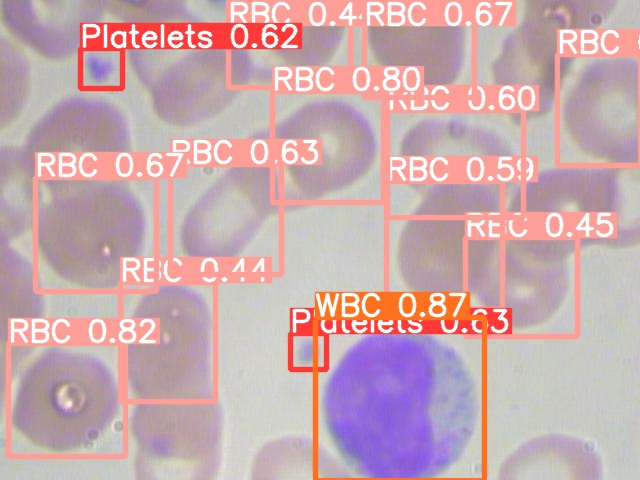

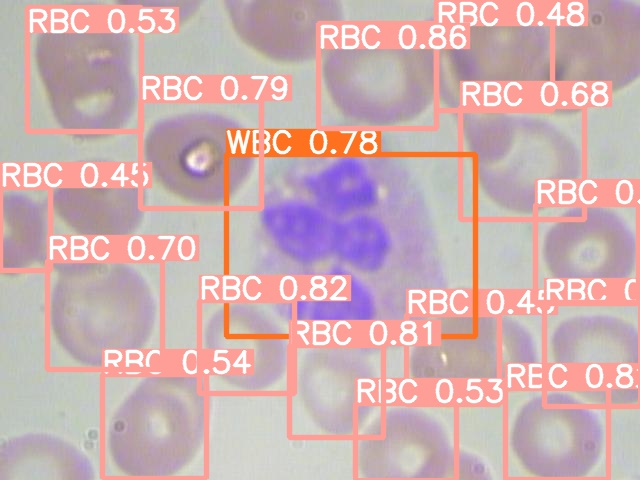

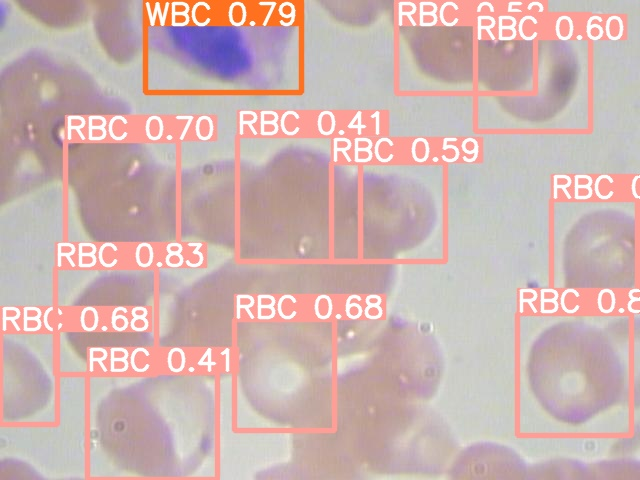

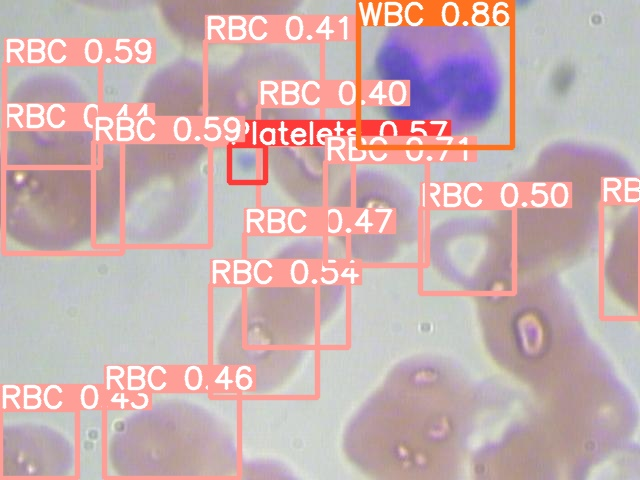

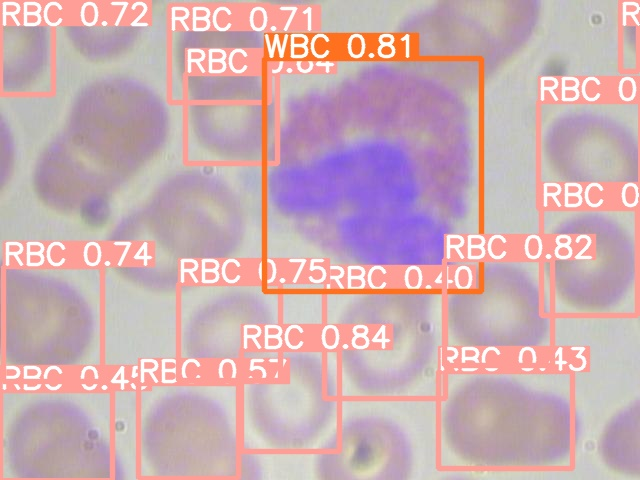

In [19]:
import glob

from IPython.display import Image, display

for imageName in glob.glob(
    "/content/yolov3/runs/detect/exp/*.jpg"
):  # assuming JPG
    display(Image(filename=imageName))
    print("\n")